In [1]:
# import cmocean.cm as cm
import matplotlib.colors as colors
import matplotlib.pyplot as plt
import cmocean.cm as cm
import numpy as np
import pandas as pd
import xarray as xr
from pathlib import Path
#from salishsea_tools import viz_tools

%matplotlib inline

oil_dict = {"akns":"ANS",
            "oils":"All Oils",
           "bunker":"Bunker-C",
           "diesel":"Diesel",
           "dilbit":"Dilbit",
           "gas":"Diesel",
           "jet":"Diesel",
           "other":"Bunker-C"}

MIDOSScolors={
    'ANS': 'darkslategrey',
    'Bunker-C':'teal',
    'Dilbit':'slategrey',
    'Diesel':'darkgoldenrod',
}
# graphics style
#plt.style.use('seaborn-poster')
plt.style.use(r"../../presentations/MEOPAR2022/meopar2022_matplotlibrc.template")
# Aggregated files path
agg_dir = Path('/data/sallen/MIDOSS/aggregated_spills_files/')
# # spills file
# spill_dir = Path(
#     '/scratch/allen/MIDOSS/'
# )
# spill_file = spill_dir/'SalishSea_oil_spills_try3.csv'
# MEOPAR ASM graphics directory
graphics_directory = Path('/ocean/rmueller/MIDOSS/graphics/beaching')


## Load the aggregated spills file

In [2]:
# thefile = agg_dir/'fiftieth_55_oils.nc'
# oil = xr.open_dataset(thefile)
# whichspills = "All Oil Spills"
# smalloils = 113 + 54

In [3]:
def truncate_colormap(cmap, minval=0.0, maxval=1.0, n=-1):
    if n == -1:
        n = cmap.N
    new_cmap = colors.LinearSegmentedColormap.from_list(
         'trunc({name},{a:.2f},{b:.2f})'.format(name=cmap.name, a=minval, b=maxval),
         cmap(np.linspace(minval, maxval, n)))
    return new_cmap

## Load the SalishSeaCast grid for plotting

In [4]:
import netCDF4 as nc
# mask is for creating regions
mask = nc.Dataset('/data/tjarniko/MEOPAR/grid/mesh_mask201702.nc')
lats = mask['nav_lat'][:]
lons = mask['nav_lon'][:]
lats=lats[1:-1,1:-1]
lons=lons[1:-1,1:-1]
lats.shape

(896, 396)

In [5]:
mesh = xr.open_dataset('/home/sallen/MEOPAR/grid/mesh_mask201702.nc')
tmask = 1- mesh.tmask[0, 0]
divarea = 1/(mesh.e1t[0, 1:-1, 1:-1] * mesh.e2t[0, 1:-1, 1:-1])
# e1t = dx
# e2t = dy
# alength = 1/(length scale), where length is the largest of dx,dy
alength = 1/np.maximum(mesh.e1t[0, 1:-1:, 1:-1], mesh.e2t[0, 1:-1, 1:-1])
mesh.close()

# set plotting values
imin = 0
jmin, jmax = 0, 398
imax = imin + (jmax - jmin)*2/500*440
imax = 898
aspect = 500/440

# specify transparancy for land mask
alpha_land = 0.2

# beaching time colormap
minColor = 0.1
maxColor = 0.85
thermal_r_t = truncate_colormap(cm.thermal_r, minColor, maxColor)

### Get beaching information

In [6]:
eps = 1e-7
mcsize = 49
perol = 1
absol = np.log(perol+1)
absol_time = 0.5
perol_time = 0.15
bv_perol = perol

oil_types = ['akns','bunker','diesel','dilbit','oils']
ma_beaching_pres={}
ma_beach_oil={}
den={}
beachoil_ste={}
beachedtime_ste={}
beachedoil={}
beachedoil_sum={}
beachedtime={}
presence={}

# load information for each oil type (and all oil combined)
for oilname in oil_types:
    thefile = agg_dir/f'fiftieth_55_{oilname}.nc'
    oil = xr.open_dataset(thefile)

    ma_beaching_pres[oilname] = np.ma.masked_array(
        oil.beachpresence, oil.beachpresence == 0
    )
    ma_beach_oil[oilname] = np.ma.masked_array(
        oil.beaching_oil[0]/(oil.beachpresence + eps), 
        oil.beachpresence == 0
    )
    den[oilname] = np.minimum(np.array(oil.beachpresence) + eps, mcsize)
    beachoil_ste[oilname] = np.std(
        oil.beaching_oil/(oil.beachpresence + eps), axis=0, ddof=1
    ) / np.sqrt(den[oilname])
    # beached volume (geometric mean)
    beachedoil[oilname] = np.ma.masked_array(
        oil.beaching_oil[0]/(oil.beachpresence + eps), 
        (oil.beachpresence <= 1) | ((beachoil_ste[oilname] > absol))
    )
    # toward calculating likelihood
    presence[oilname]=np.ma.masked_array(oil.beachpresence, 
        (oil.beachpresence <= 1) | ((beachoil_ste[oilname] > absol))
    )
    # beached time (geometric mean)
    beachedtime_ste[oilname] = np.std(oil.beaching_time, axis=0, ddof=1) / np.sqrt(den[oilname])
    beachedtime[oilname]=np.ma.masked_array(
        oil.beaching_time[0]/(oil.beachpresence + eps), 
        (oil.beachpresence <= 1) | 
        ((beachedtime_ste[oilname]/(oil.beachpresence+eps) > absol_time) | 
        (beachedtime_ste[oilname] > absol_time*oil.beaching_time[0])))

    oil.close()

## Create ordered dataframe with largest values last, for all oils

In [7]:
oilname='oils'
coords=np.asarray(np.argwhere(beachedoil[oilname]))
x, y = coords[:, 0], coords[:, 1]
df = pd.DataFrame(data={'x': x,
                        'y': y,
                        'z': np.exp(beachedoil[oilname]).compressed()})
df.sort_values('z', ascending=True, inplace=True)

In [8]:
np.exp(beachedoil[oilname]).min()

0.010889018744041225

In [9]:
np.exp(beachedoil[oilname]).max()

3.2578265958520287

##  Beached volume

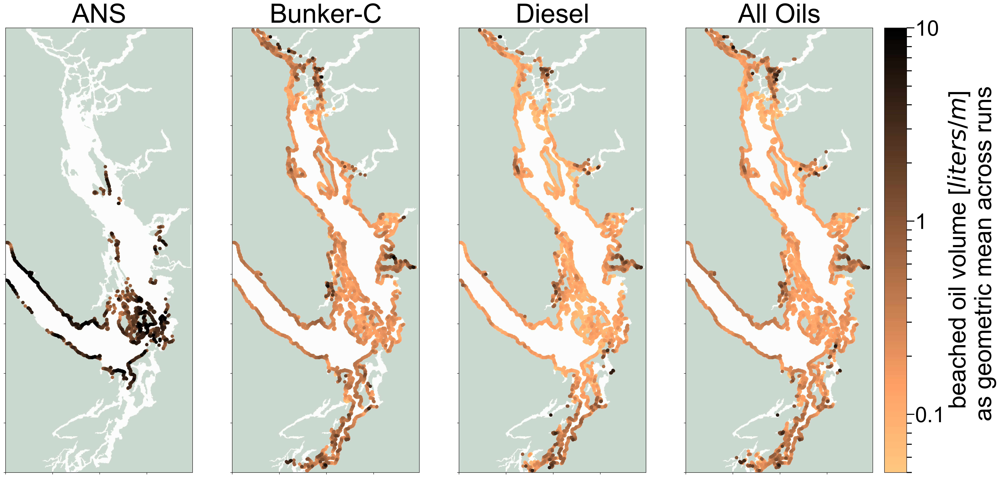

In [10]:
# set fontsize
fs = 42
oil_types = ['akns','bunker','diesel','oils']

plt.style.use(r"../../presentations/MEOPAR2022/meopar2022_matplotlibrc.template")


fig, ax = plt.subplots(1,len(oil_types), figsize = (32,16),
          gridspec_kw={'width_ratios': [1 ,1, 1, 1.25]})
# Add plots for different oil types

for idx,oilname in enumerate(oil_types):
    # create dataframe for oil type
    beached_oil = np.exp(beachedoil[oilname]) * alength * 1000
    # get the x,y values in vector form
    coords=np.asarray(np.argwhere(beached_oil))
    x, y = coords[:, 0], coords[:, 1]
    # get the beached oil in vector form
    beached_oil_1d = beached_oil.compressed()
    df = pd.DataFrame(data={'x': x,
                        'y': y,
                        'z': beached_oil_1d})
    df.sort_values('z', ascending=True, inplace=True)
    # plotting the land mask
    ax[idx].pcolormesh(1.8*tmask[1:, 1:], cmap='Greens', 
                  vmin=-0.2, vmax=1.6, alpha=alpha_land)
    #ax[idx].contour(tmask[1:, 1:], linewidths=.2, colors='grey', alpha=.5)
    sc=ax[idx].scatter(df.y,df.x,c=df.z, 
                  s=32, 
                  cmap = 'copper_r',
                 norm=colors.LogNorm(vmin=0.05, vmax=10))
    ax[idx].set_xticklabels('')
    ax[idx].set_yticklabels('')
    ax[idx].set_title(oil_dict[oilname], fontsize = fs+10)
# from mpl_toolkits.axes_grid1 import make_axes_locatable
# divider = make_axes_locatable(ax[idx])
#cax = divider.append_axes('right', size="20%", pad=0.8,)
#cbar = fig.colorbar(sc, cax=cax, orientation='vertical');
cbar = plt.colorbar(
    sc,
    orientation='vertical',
    ticks=[0.1, 1, 10]
)
cbar.ax.set_yticklabels(['0.1', '1', '10'])
cbar.ax.tick_params(labelsize=fs) 
cbar.ax.tick_params(which='both', width=2)
cbar.ax.tick_params(which='major', length=15)
cbar.ax.tick_params(which='minor', length=10, color='k')
cbar.set_label('beached oil volume [$liters/m$]\nas geometric mean across runs ', fontsize = fs+5);
plt.savefig(graphics_directory/'beached_volume_4panel.png')

In [11]:
beached_oil.shape

(896, 396)

## Likelihood

akns: 0.68 [min] - 33.33 max] 
bunker: 14.29 [min] - 100.00 max] 
diesel: 10.53 [min] - 100.00 max] 
oils: 100.00 [min] - 100.00 max] 


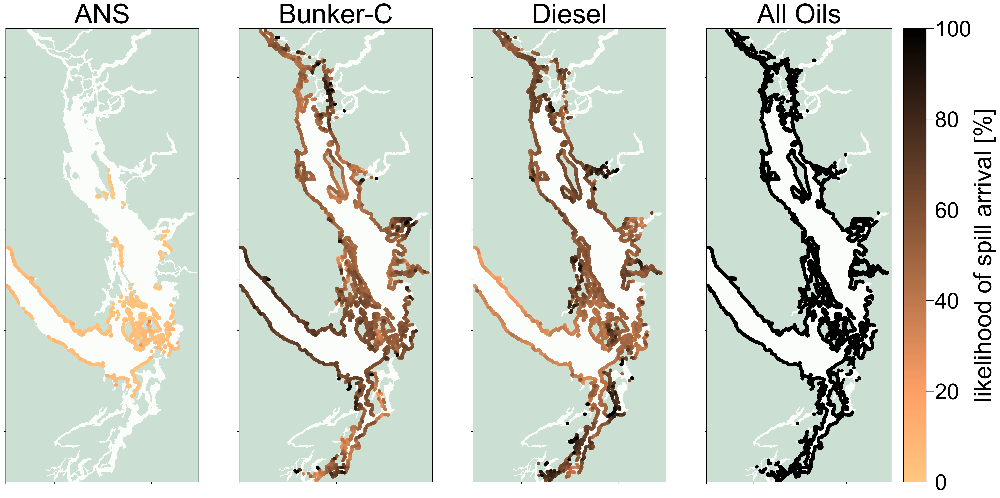

In [12]:
fig, ax = plt.subplots(1,len(oil_types), figsize = (32,16),
          gridspec_kw={'width_ratios': [1 ,1, 1, 1.2]})
# Add plots for different oil types

for idx,oilname in enumerate(oil_types):
    # create dataframe for oil type
    likelihood = 100*presence[oilname]/presence['oils']
    print(f'{oilname}: {likelihood.min():1.2f} [min] - {likelihood.max():1.2f} max] ')
    #beached_oil = np.exp(beachedoil[oilname])
    # get the x,y values in vector form
    coords=np.asarray(np.argwhere(likelihood))
    x, y = coords[:, 0], coords[:, 1]
    # get the beached oil in vector form
    likelihood_1d = likelihood.compressed()
    df = pd.DataFrame(data={'x': x,
                        'y': y,
                        'z': likelihood_1d})
    df.sort_values('z', ascending=True, inplace=True)
    # plotting the land mask
    ax[idx].pcolormesh(1.8*tmask[1:, 1:], cmap='Greens', 
                  vmin=-0.2, vmax=2, alpha=alpha_land)
    
    sc=ax[idx].scatter(df.y,df.x,c=df.z, 
                  s=32, 
                  cmap = 'copper_r',
                  vmin=0, vmax=100
    )
     
    ax[idx].set_xticklabels('')
    ax[idx].set_yticklabels('')
    ax[idx].set_title(oil_dict[oilname], fontsize = fs+10)
# from mpl_toolkits.axes_grid1 import make_axes_locatable
# divider = make_axes_locatable(ax[idx])
# cax = divider.append_axes('right', size="20%", pad=0.8,)
#cbar = fig.colorbar(sc, cax=cax, orientation='vertical');
cbar = plt.colorbar(sc,orientation='vertical')
cbar.ax.tick_params(labelsize=fs)
cbar.ax.tick_params(which='major', length=15, color='k') 
cbar.set_label('likelihood of spill arrival [%]', fontsize = fs+5);
plt.savefig(graphics_directory/'beached_likelihood_4panel.png')

akns: 0.68 [min] - 33.33 max] 
bunker: 14.29 [min] - 100.00 max] 
diesel: 10.53 [min] - 100.00 max] 
oils: 100.00 [min] - 100.00 max] 


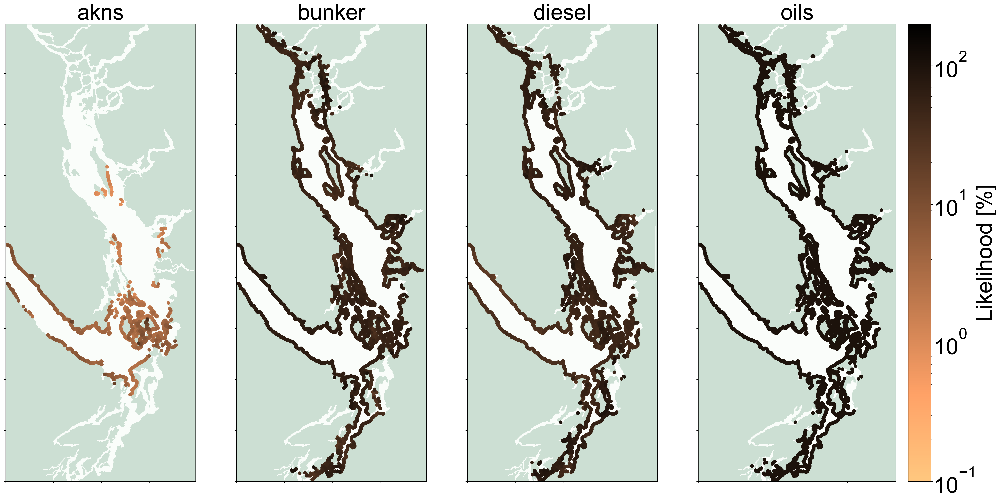

In [13]:
fig, ax = plt.subplots(1,len(oil_types), figsize = (32,16),
          gridspec_kw={'width_ratios': [1 ,1, 1, 1.3]})
# Add plots for different oil types

for idx,oilname in enumerate(oil_types):
    # create dataframe for oil type
    likelihood = 100*presence[oilname]/presence['oils']
    print(f'{oilname}: {likelihood.min():1.2f} [min] - {likelihood.max():1.2f} max] ')
    #beached_oil = np.exp(beachedoil[oilname])
    # get the x,y values in vector form
    coords=np.asarray(np.argwhere(likelihood))
    x, y = coords[:, 0], coords[:, 1]
    # get the beached oil in vector form
    likelihood_1d = likelihood.compressed()
    df = pd.DataFrame(data={'x': x,
                        'y': y,
                        'z': likelihood_1d})
    df.sort_values('z', ascending=True, inplace=True)
    # plotting the land mask
    ax[idx].pcolormesh(1.8*tmask[1:, 1:], cmap='Greens', 
                  vmin=-0.2, vmax=2, alpha=alpha_land)
    
    sc=ax[idx].scatter(df.y,df.x,c=df.z, 
                  s=32, 
                  cmap = 'copper_r',
                  norm=colors.LogNorm(vmin=0.1, vmax=200)
    )
     
    ax[idx].set_xticklabels('')
    ax[idx].set_yticklabels('')
    ax[idx].set_title(oilname, fontsize = fs)
# from mpl_toolkits.axes_grid1 import make_axes_locatable
# divider = make_axes_locatable(ax[idx])
# cax = divider.append_axes('right', size="20%", pad=0.8,)
#cbar = fig.colorbar(sc, cax=cax, orientation='vertical');
cbar = plt.colorbar(sc,orientation='vertical')
cbar.ax.tick_params(labelsize=fs) 
cbar.set_label('Likelihood [%]', fontsize = fs);

## Beaching Time

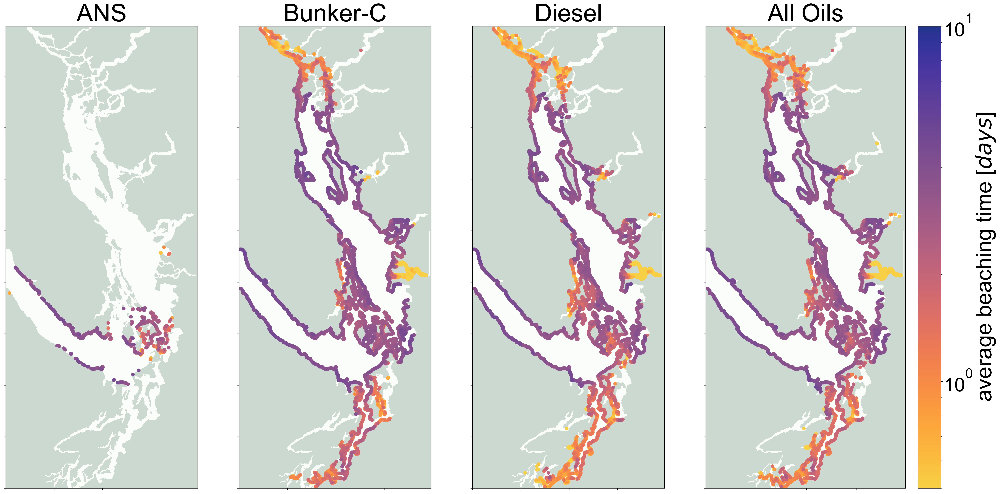

In [14]:
# set fontsize
fs = 36
oil_types = ['akns','bunker','diesel','oils']


fig, ax = plt.subplots(1,len(oil_types), figsize = (32,16),
          gridspec_kw={'width_ratios': [1 ,1, 1, 1.3]})
# Add plots for different oil types

for idx,oilname in enumerate(oil_types):
    # create dataframe for oil type
    beached_time = beachedtime[oilname] 
    # get the x,y values in vector form
    coords=np.asarray(np.argwhere(beached_time))
    x, y = coords[:, 0], coords[:, 1]
    # get the beached oil in vector form
    beached_time_1d = beached_time.compressed()
    df = pd.DataFrame(data={'x': x,
                        'y': y,
                        'z': beached_time_1d})
    df.sort_values('z', ascending=True, inplace=True)
    # plotting the land mask
    ax[idx].pcolormesh(1.8*tmask[1:, 1:], cmap='Greens', 
                  vmin=-0.2, vmax=1.6, alpha=alpha_land)
    sc=ax[idx].scatter(df.y,df.x,c=df.z, 
                  s=32, 
                  cmap = thermal_r_t,#'CMRmap',
                 norm=colors.LogNorm(vmin=0.5, vmax=10))
    ax[idx].set_xticklabels('')
    ax[idx].set_yticklabels('')
    ax[idx].set_title(oil_dict[oilname], fontsize = fs+10)
# from mpl_toolkits.axes_grid1 import make_axes_locatable
# divider = make_axes_locatable(ax[idx])
#cax = divider.append_axes('right', size="20%", pad=0.8,)
#cbar = fig.colorbar(sc, cax=cax, orientation='vertical');
cbar = plt.colorbar(sc,orientation='vertical')
cbar.ax.tick_params(labelsize=fs) 
cbar.set_label('average beaching time [$days$]', fontsize = fs+5);
plt.savefig(graphics_directory/'beached_time_4panel_ws2.png')

## plot up volume, likelihood, and average time for different regions

In [16]:
## Create masks
JDF = (((lats > 48.079463) & (lats < 48.477097)) & (lons < -123.183364))
Gulf_Is = (((lats > 48.693059) & (lats < 48.953784)) & ((lons > -123.661884) & (lons < -123.044003)))
PS = (lats < 48.064543)

In [17]:
beachedoil["akns"][JDF].shape

(20707,)

In [18]:
# create dataframe for oil type
ans={}
bunker={}
diesel={}

# ~~~~ TIME ~~~~~~
ans['beach_time'] = [
    np.median(beachedtime["akns"][JDF].compressed()), 
    np.median(beachedtime["akns"][Gulf_Is].compressed()), 
    np.median(beachedtime["akns"][PS].compressed())
]
bunker['beach_time'] = [
    np.median(beachedtime["bunker"][JDF].compressed()), 
    np.median(beachedtime["bunker"][Gulf_Is].compressed()), 
    np.median(beachedtime["bunker"][PS].compressed())
]
diesel['beach_time'] = [
    np.median(beachedtime["diesel"][JDF].compressed()), 
    np.median(beachedtime["diesel"][Gulf_Is].compressed()), 
    np.median(beachedtime["diesel"][PS].compressed())
]

beached_time = pd.DataFrame({
    "ANS":ans['beach_time'],
    "Bunker-C":bunker['beach_time'],
    "Diesel":diesel['beach_time']
    }, 
    index=["Juan de Fuca", "Gulf Islands","Puget Sound"]
)

#~~~~ VOLUME ~~~~~
volume={}
for oilname in ["akns", "bunker","diesel"]:
    volume[oilname] = np.exp(beachedoil[oilname]) * alength * 1000

ans['beach_volume'] = [
    np.median(volume["akns"][JDF].compressed()), 
    np.median(volume["akns"][Gulf_Is].compressed()), 
    np.median(volume["akns"][PS].compressed())
]
bunker['beach_volume'] = [
    np.median(volume["bunker"][JDF].compressed()), 
    np.median(volume["bunker"][Gulf_Is].compressed()), 
    np.median(volume["bunker"][PS].compressed())
]
diesel['beach_volume'] = [
    np.median(volume["diesel"][JDF].compressed()), 
    np.median(volume["diesel"][Gulf_Is].compressed()), 
    np.median(volume["diesel"][PS].compressed())
]

beach_volume = pd.DataFrame({
    "ANS":ans['beach_volume'],
    "Bunker-C":bunker['beach_volume'],
    "Diesel":diesel['beach_volume']
    }, 
    index=["Juan de Fuca", "Gulf Islands","Puget Sound"]
)

# ~~~~ LIKELIHOOD ~~~
likelihood={}
for oilname in ["akns", "bunker","diesel"]:
    likelihood[oilname] = 100*presence[oilname]/presence['oils']
    
ans['likelihood'] = [
    np.median(likelihood["akns"][JDF].compressed()), 
    np.median(likelihood["akns"][Gulf_Is].compressed()), 
    np.median(likelihood["akns"][PS].compressed())
]
bunker['likelihood'] = [
    np.median(likelihood["bunker"][JDF].compressed()), 
    np.median(likelihood["bunker"][Gulf_Is].compressed()), 
    np.median(likelihood["bunker"][PS].compressed())
]
diesel['likelihood'] = [
    np.median(likelihood["diesel"][JDF].compressed()), 
    np.median(likelihood["diesel"][Gulf_Is].compressed()), 
    np.median(likelihood["diesel"][PS].compressed())
]

beach_likelihood = pd.DataFrame({
    "ANS":ans['likelihood'],
    "Bunker-C":bunker['likelihood'],
    "Diesel":diesel['likelihood']
    }, 
    index=["Juan de Fuca", "Gulf Islands","Puget Sound"]
)



/home/rmueller/miniconda3/envs/monte-carlo/lib/python3.9/site-packages/numpy/core/fromnumeric.py:3474: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/home/rmueller/miniconda3/envs/monte-carlo/lib/python3.9/site-packages/numpy/core/_methods.py:189: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


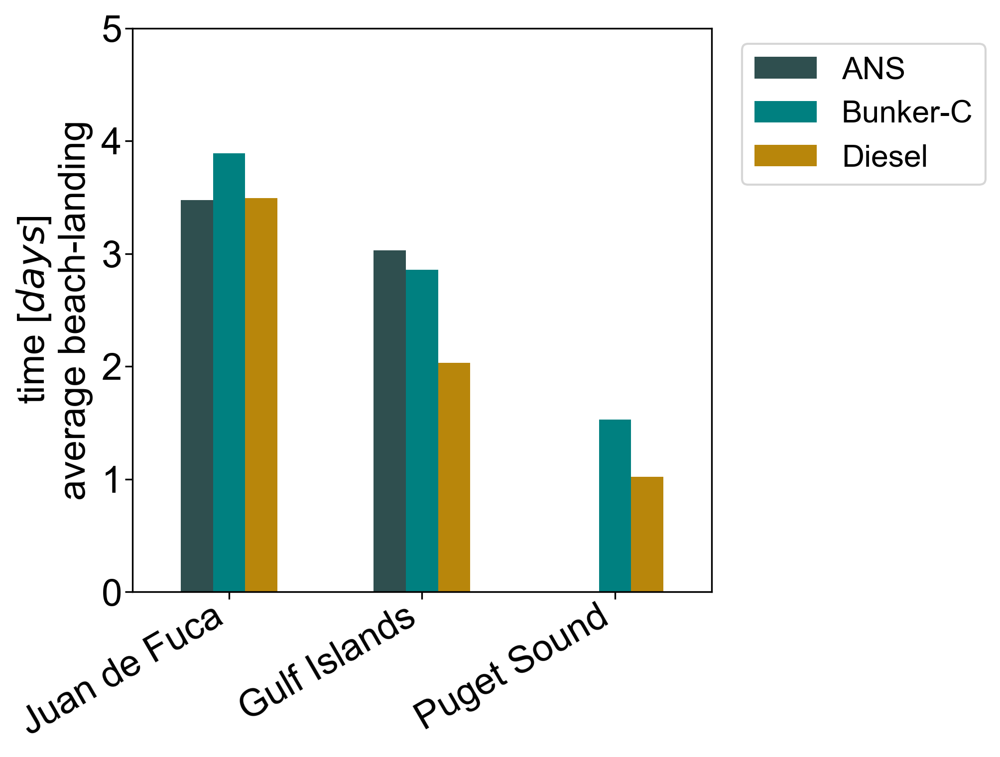

In [19]:
#~~~ TIME ~~~~
fig, ax = plt.subplots(nrows=1, ncols=1, figsize=(5, 5),
                       gridspec_kw={
                           'width_ratios': [1],
                           'height_ratios': [1],
                       'wspace': 0.4,
                       'hspace': 0.2})
beached_time.plot(ax=ax,
    kind="bar",
    color=[MIDOSScolors["ANS"],MIDOSScolors["Bunker-C"],MIDOSScolors["Diesel"]],
    legend=False,          
)
ax.set_ylabel("time [$days$]\naverage beach-landing")
ax.legend(bbox_to_anchor=(1.5, 1), loc='upper right')
ax.set_ylim(0,5)
ax.set_yticks([0,1,2,3,4,5])
ax.set_xticklabels(
    ["Juan de Fuca", "Gulf Islands", "Puget Sound"],
    rotation=30, ha='right'
)

plt.savefig(graphics_directory/'BeachTime_byRegion.png')


                   ANS  Bunker-C    Diesel
Juan de Fuca  3.526494  0.282575  0.129780
Gulf Islands  1.253912  0.139486  0.089611
Puget Sound   1.295241  0.305477  0.215570


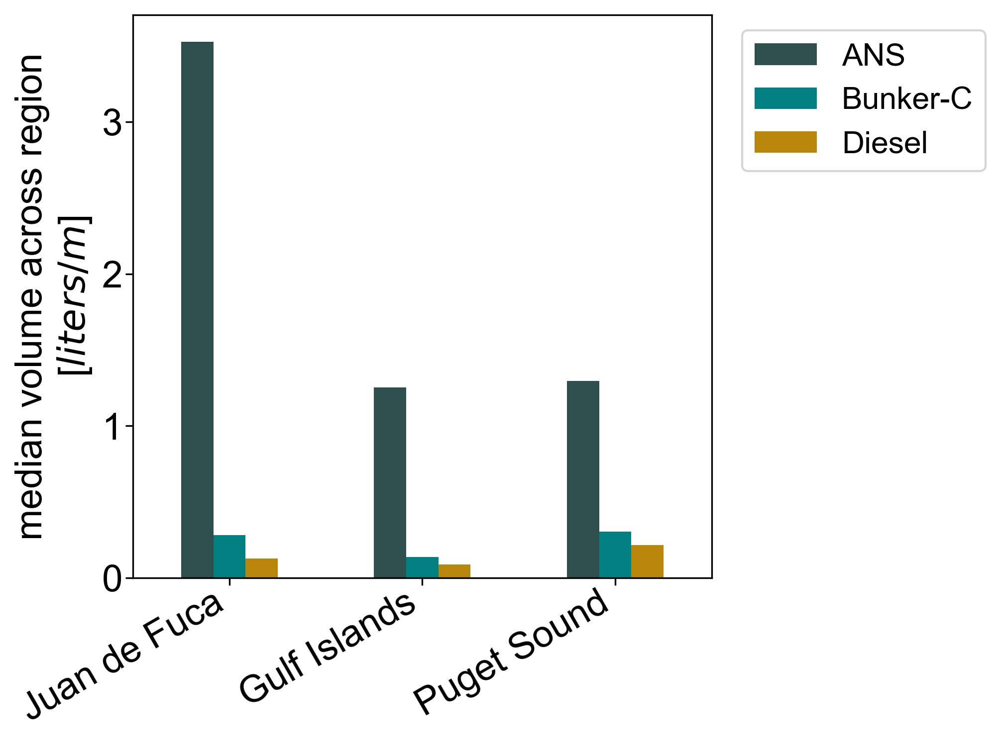

In [20]:
#~~~  VOLUME ~~~~
fig, ax = plt.subplots(nrows=1, ncols=1, figsize=(5, 5),
                       gridspec_kw={
                           'width_ratios': [1],
                           'height_ratios': [1],
                       'wspace': 0.4,
                       'hspace': 0.2})
beach_volume.plot(ax=ax,
    kind="bar",
    color=[MIDOSScolors["ANS"],MIDOSScolors["Bunker-C"],MIDOSScolors["Diesel"]],
    legend=False
)
ax.set_ylabel("median volume across region\n[$liters/m$]")
ax.legend(bbox_to_anchor=(1.5, 1), loc='upper right')
#ax.set_ylim(1e-5,4e0)
ax.set_xticklabels(
    ["Juan de Fuca", "Gulf Islands", "Puget Sound"],
    rotation=30, ha='right'
)

plt.savefig(graphics_directory/'Volume_byRegion.png')
print(beach_volume)


                   ANS  Bunker-C    Diesel
Juan de Fuca  3.526494  0.282575  0.129780
Gulf Islands  1.253912  0.139486  0.089611
Puget Sound   1.295241  0.305477  0.215570


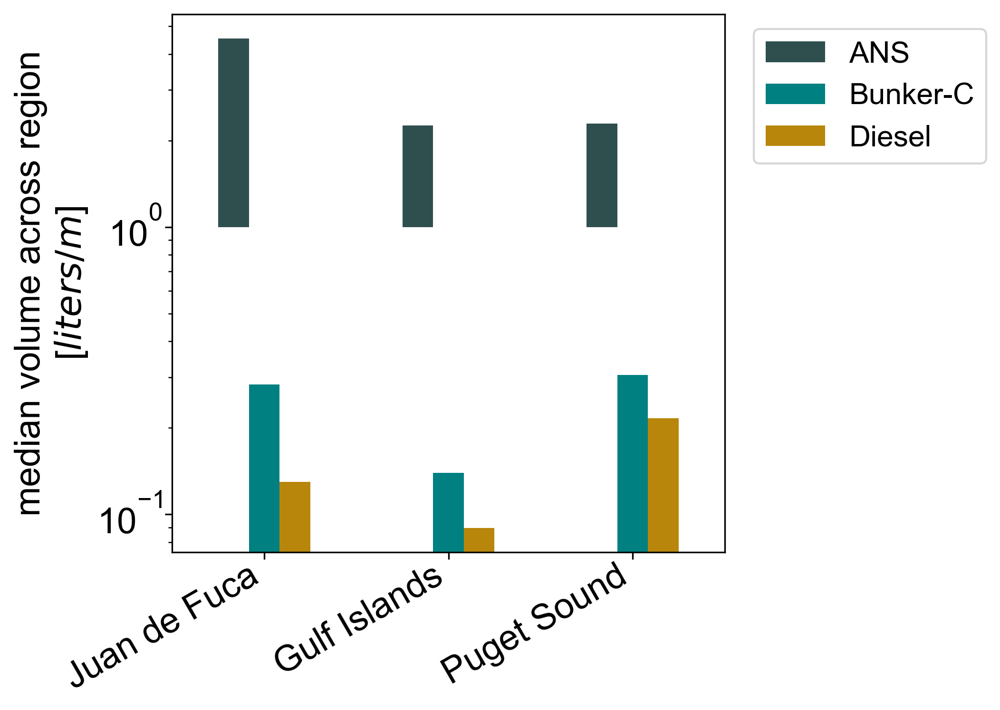

In [21]:
#~~~  VOLUME ~~~~
fig, ax = plt.subplots(nrows=1, ncols=1, figsize=(5, 5),
                       gridspec_kw={
                           'width_ratios': [1],
                           'height_ratios': [1],
                       'wspace': 0.4,
                       'hspace': 0.2})
beach_volume.plot(ax=ax,
    kind="bar",
    color=[MIDOSScolors["ANS"],MIDOSScolors["Bunker-C"],MIDOSScolors["Diesel"]],
    legend=False,
    log=True
)
ax.set_ylabel("median volume across region\n[$liters/m$]")
ax.legend(bbox_to_anchor=(1.5, 1), loc='upper right')
#ax.set_ylim(1e-5,4e0)
ax.set_xticklabels(
    ["Juan de Fuca", "Gulf Islands", "Puget Sound"],
    rotation=30, ha='right'
)

plt.savefig(graphics_directory/'Volume_byRegion_ln.png')
print(beach_volume)

                   ANS   Bunker-C     Diesel
Juan de Fuca  4.528302  65.443799  30.335366
Gulf Islands  2.044998  50.000000  50.000000
Puget Sound   1.996275  46.833874  59.375000


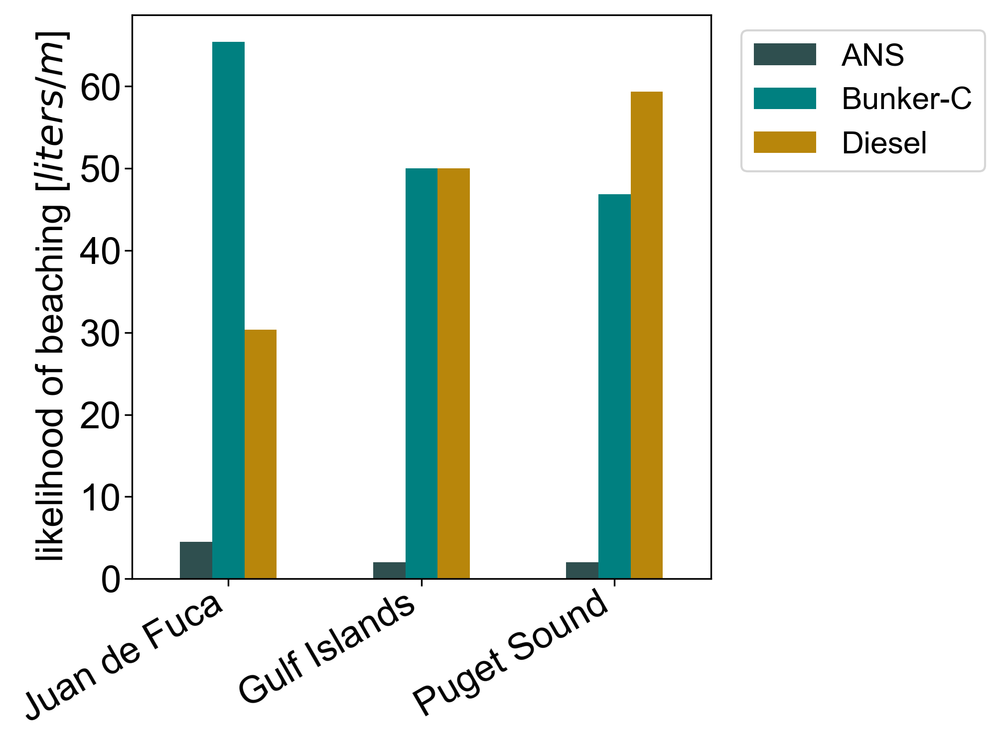

In [22]:
#~~~  VOLUME ~~~~
fig, ax = plt.subplots(nrows=1, ncols=1, figsize=(5, 5),
                       gridspec_kw={
                           'width_ratios': [1],
                           'height_ratios': [1],
                       'wspace': 0.4,
                       'hspace': 0.2})
beach_likelihood.plot(ax=ax,
    kind="bar",
    color=[MIDOSScolors["ANS"],MIDOSScolors["Bunker-C"],MIDOSScolors["Diesel"]],
    legend=False
)
ax.set_ylabel("likelihood of beaching [$liters/m$]")
ax.legend(bbox_to_anchor=(1.5, 1), loc='upper right')
#ax.set_ylim(1e-5,4e0)
ax.set_xticklabels(
    ["Juan de Fuca", "Gulf Islands", "Puget Sound"],
    rotation=30, ha='right'
)

plt.savefig(graphics_directory/'Likelihood_byRegion.png')
print(beach_likelihood)

